# Problem framing

**Goal**: Predict the income level (more or less than $50K per year) for a sample of the US population and identify characteristics that are associated with a person making more or less than $50K per year (binary target).

## Working outline

1. Understand the data
    - Check for missing values
    - Check for duplicate values
    - Instance weights should be ignored during modeling
2. Explore / Clean the data
    - Handle duplicate/missing values
        - Noticed "?" values for move codes that may be related
    - Visualize target distribution
    - Univariate analysis for continuous and categorical variables
    - Correlations between continuous variables
    - Bivariate: Income level vs. predictor variables (association tests, visuals)
    - Check for separation issues if time (regularization considerations)
3. Feature engineering
    - Group high-level categoricals
    - Feature selection
    - Consolidate into pipelines
    - One hot encoding for categoricals
4. Modeling
    - Setup cross-validation using training data
    - Baseline model
        - Logistic regression with L2 regularization
            - L2 will help with multicollinearity, separation checks, chi-square
    - More complex models for comparison
        - Random forest
        - XGBoost, if time
5. Evaluation
    - Focus on F1-score, precision, recall
    - Analyze confusion matrix
    - Feature importance scores (permutation)
    - Random feature importance evaluation
6. Interpret results
    - Connect important features to policy
    - Discuss policy impact such as factors contributing to income inequality 


# Load data and quality checks

In [311]:
import polars as pl
import polars.selectors as cs
import plotly.graph_objects as go
import plotly.express as px

pl.Config.set_fmt_str_lengths(100)

# CSV data without headers so adding in column names based on metadata file
DATA_COLS = [
    "AGE",
    "CLASS_WORKER",
    "INDUSTRY",
    "OCCUPATION",
    "EDUCATION",
    "WAGE_PER_HOUR",
    "ENROLLED_IN_EDU_LAST_WK",
    "MARITAL_STATUS",
    "MJR_INDUSTRY_CODE",
    "MJR_OCCUPATION_CODE",
    "RACE",
    "HISPANIC_ORIGIN",
    "SEX",
    "LABOR_UNION_MEMBER",
    "UNEMPLOY_REASON",
    "EMPLOY_STAT",
    "CAPITAL_GAIN",
    "CAPITAL_LOSS",
    "STOCK_DIVIDEND",
    "TAX_FILER_STAT",
    "PREV_RESID_REGION",
    "PREV_RESID_STATE",
    "HH_FAM_STAT",
    "HH_SUMMARY",
    "INSTANCE_WGT",
    "MOVE_CHANGE_IN_MSA",
    "MOVE_WITHIN_AREA",
    "MOVE_PREV_REG",
    "RESID_SAME",
    "MOVE_PREV_RES_SUNBELT",
    "NUM_EMP",
    "PARENTS",
    "BIRTH_FATHER_COUNTRY",
    "BIRTH_MOTHER_COUNTRY",
    "SELF_COUNTRY",
    "CITIZENSHIP",
    "OWN_BUSINESS",
    "VET_QVA",
    "VET_BENEFITS",
    "WKS_WORK",
    "YEAR",
    "INCOME_LEVEL",
]

# Treating `NUM_EMP` as ordinal instead of continuous based on data dictionary
CONTINUOUS_COLS = [
    "AGE",
    "WAGE_PER_HOUR",
    "CAPITAL_GAIN",
    "CAPITAL_LOSS",
    "STOCK_DIVIDEND",
    "WKS_WORK",
]

TARGET_MAPPING = {
    "- 50000.": 0,
    "50000+.": 1,
}

NIU_LABEL = "Not in universe"


# Stripping all the strings and converting the continuous vars / target to int and categorical vars to categorical type
def load_data(path: str) -> pl.DataFrame:
    return (
        pl.read_csv(path, has_header=False, new_columns=DATA_COLS)
        .with_columns(
            pl.col(pl.String).str.strip_chars(),
        )
        .with_columns(
            pl.exclude(CONTINUOUS_COLS, "INCOME_LEVEL", "INSTANCE_WGT").cast(
                pl.Categorical
            ),
            INCOME_LEVEL=pl.col("INCOME_LEVEL").replace(TARGET_MAPPING),
        )
        .cast(
            {
                "AGE": pl.Int32,
                "WAGE_PER_HOUR": pl.Int32,
                "CAPITAL_GAIN": pl.Int32,
                "CAPITAL_LOSS": pl.Int32,
                "STOCK_DIVIDEND": pl.Int32,
                "NUM_EMP": pl.Int32,
                "WKS_WORK": pl.Int32,
                "INCOME_LEVEL": pl.Int32,
            }
        )
    )


train_data = load_data("../data/census_income_learn.csv")
test_data = load_data("../data/census_income_test.csv")

In [312]:
display(train_data.head())
test_data.head()

AGE,CLASS_WORKER,INDUSTRY,OCCUPATION,EDUCATION,WAGE_PER_HOUR,ENROLLED_IN_EDU_LAST_WK,MARITAL_STATUS,MJR_INDUSTRY_CODE,MJR_OCCUPATION_CODE,RACE,HISPANIC_ORIGIN,SEX,LABOR_UNION_MEMBER,UNEMPLOY_REASON,EMPLOY_STAT,CAPITAL_GAIN,CAPITAL_LOSS,STOCK_DIVIDEND,TAX_FILER_STAT,PREV_RESID_REGION,PREV_RESID_STATE,HH_FAM_STAT,HH_SUMMARY,INSTANCE_WGT,MOVE_CHANGE_IN_MSA,MOVE_WITHIN_AREA,MOVE_PREV_REG,RESID_SAME,MOVE_PREV_RES_SUNBELT,NUM_EMP,PARENTS,BIRTH_FATHER_COUNTRY,BIRTH_MOTHER_COUNTRY,SELF_COUNTRY,CITIZENSHIP,OWN_BUSINESS,VET_QVA,VET_BENEFITS,WKS_WORK,YEAR,INCOME_LEVEL
i32,cat,cat,cat,cat,i32,cat,cat,cat,cat,cat,cat,cat,cat,cat,cat,i32,i32,i32,cat,cat,cat,cat,cat,str,cat,cat,cat,cat,cat,i32,cat,cat,cat,cat,cat,cat,cat,cat,i32,cat,i32
73,"""Not in universe""","""0""","""0""","""High school graduate""",0,"""Not in universe""","""Widowed""","""Not in universe or children""","""Not in universe""","""White""","""All other""","""Female""","""Not in universe""","""Not in universe""","""Not in labor force""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Other Rel 18+ ever marr not in subfamily""","""Other relative of householder""","""1700.09""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",23,"""Not in universe""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""2""",0,"""95""",0
58,"""Self-employed-not incorporated""","""4""","""34""","""Some college but no degree""",0,"""Not in universe""","""Divorced""","""Construction""","""Precision production craft & repair""","""White""","""All other""","""Male""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Head of household""","""South""","""Arkansas""","""Householder""","""Householder""","""1053.55""","""MSA to MSA""","""Same county""","""Same county""","""No""","""Yes""",94,"""Not in universe""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""2""",52,"""94""",0
18,"""Not in universe""","""0""","""0""","""10th grade""",0,"""High school""","""Never married""","""Not in universe or children""","""Not in universe""","""Asian or Pacific Islander""","""All other""","""Female""","""Not in universe""","""Not in universe""","""Not in labor force""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child 18+ never marr Not in a subfamily""","""Child 18 or older""","""991.95""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",23,"""Not in universe""","""Vietnam""","""Vietnam""","""Vietnam""","""Foreign born- Not a citizen of U S""","""0""","""Not in universe""","""2""",0,"""95""",0
9,"""Not in universe""","""0""","""0""","""Children""",0,"""Not in universe""","""Never married""","""Not in universe or children""","""Not in universe""","""White""","""All other""","""Female""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""1758.14""","""Nonmover""","""Nonmover""","""Nonmover""","""Yes""","""Not in universe""",23,"""Both parents present""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""0""",0,"""94""",0
10,"""Not in universe""","""0""","""0""","""Children""",0,"""Not in universe""","""Never married""","""Not in universe or children""","""Not in universe""","""White""","""All other""","""Female""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""1069.16""","""Nonmover""","""Nonmover""","""Nonmover""","""Yes""","""Not in universe""",23,"""Both parents present""","""United-States""","""United-States""","

AGE,CLASS_WORKER,INDUSTRY,OCCUPATION,EDUCATION,WAGE_PER_HOUR,ENROLLED_IN_EDU_LAST_WK,MARITAL_STATUS,MJR_INDUSTRY_CODE,MJR_OCCUPATION_CODE,RACE,HISPANIC_ORIGIN,SEX,LABOR_UNION_MEMBER,UNEMPLOY_REASON,EMPLOY_STAT,CAPITAL_GAIN,CAPITAL_LOSS,STOCK_DIVIDEND,TAX_FILER_STAT,PREV_RESID_REGION,PREV_RESID_STATE,HH_FAM_STAT,HH_SUMMARY,INSTANCE_WGT,MOVE_CHANGE_IN_MSA,MOVE_WITHIN_AREA,MOVE_PREV_REG,RESID_SAME,MOVE_PREV_RES_SUNBELT,NUM_EMP,PARENTS,BIRTH_FATHER_COUNTRY,BIRTH_MOTHER_COUNTRY,SELF_COUNTRY,CITIZENSHIP,OWN_BUSINESS,VET_QVA,VET_BENEFITS,WKS_WORK,YEAR,INCOME_LEVEL
i32,cat,cat,cat,cat,i32,cat,cat,cat,cat,cat,cat,cat,cat,cat,cat,i32,i32,i32,cat,cat,cat,cat,cat,str,cat,cat,cat,cat,cat,i32,cat,cat,cat,cat,cat,cat,cat,cat,i32,cat,i32
38,"""Private""","""6""","""36""","""1st 2nd 3rd or 4th grade""",0,"""Not in universe""","""Married-civilian spouse present""","""Manufacturing-durable goods""","""Machine operators assmblrs & inspctrs""","""White""","""Mexican (Mexicano)""","""Female""","""Not in universe""","""Not in universe""","""Full-time schedules""",0,0,0,"""Joint one under 65 & one 65+""","""Not in universe""","""Not in universe""","""Spouse of householder""","""Spouse of householder""","""1032.38""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",28,"""Not in universe""","""Mexico""","""Mexico""","""Mexico""","""Foreign born- Not a citizen of U S""","""0""","""Not in universe""","""2""",12,"""95""",0
44,"""Self-employed-not incorporated""","""37""","""12""","""Associates degree-occup /vocational""",0,"""Not in universe""","""Married-civilian spouse present""","""Business and repair services""","""Professional specialty""","""White""","""All other""","""Female""","""Not in universe""","""Not in universe""","""PT for econ reasons usually PT""",0,0,2500,"""Joint both under 65""","""Not in universe""","""Not in universe""","""Spouse of householder""","""Spouse of householder""","""1462.33""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",94,"""Not in universe""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""2""",26,"""95""",0
2,"""Not in universe""","""0""","""0""","""Children""",0,"""Not in universe""","""Never married""","""Not in universe or children""","""Not in universe""","""White""","""Mexican-American""","""Male""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""1601.75""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",23,"""Both parents present""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""0""",0,"""95""",0
35,"""Private""","""29""","""3""","""High school graduate""",0,"""Not in universe""","""Divorced""","""Transportation""","""Executive admin and managerial""","""White""","""All other""","""Female""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Head of household""","""Not in universe""","""Not in universe""","""Householder""","""Householder""","""1866.88""","""Nonmover""","""Nonmover""","""Nonmover""","""Yes""","""Not in universe""",68,"""Not in universe""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""2""","""Not in universe""","""2""",52,"""94""",0
49,"""Private""","""4""","""34""","""High school graduate""",0,"""Not in universe""","""Divorced""","""Construction""","""Precision production craft & repair""","""White""","""All other""","""Male""","""Not in universe""","""Not in universe""","""Full-time schedules""",0,0,0,"""Single""","""Not in universe""","""Not in universe""","""Secondary individual""","""Nonrelative of householder""","""1394.54""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?"""

In [313]:
continuous_bound_expr = (
    (pl.col("AGE") < 0)
    | (pl.col("WAGE_PER_HOUR") < 0)
    | (pl.col("CAPITAL_GAIN") < 0)
    | (pl.col("CAPITAL_LOSS") < 0)
    | (pl.col("STOCK_DIVIDEND") < 0)
    | (pl.col("WKS_WORK") < 0)
)
display(train_data.select(pl.col(CONTINUOUS_COLS)).filter(continuous_bound_expr))

display(test_data.select(pl.col(CONTINUOUS_COLS)).filter(continuous_bound_expr))


AGE,WAGE_PER_HOUR,CAPITAL_GAIN,CAPITAL_LOSS,STOCK_DIVIDEND,WKS_WORK
i32,i32,i32,i32,i32,i32


AGE,WAGE_PER_HOUR,CAPITAL_GAIN,CAPITAL_LOSS,STOCK_DIVIDEND,WKS_WORK
i32,i32,i32,i32,i32,i32


In [314]:
# Checking that column labels are correct and matches unique levels (categorical variables) specified in metadata
display(train_data.select(pl.all().n_unique()))
(
    train_data.select(pl.all().n_unique()) == test_data.select(pl.all().n_unique())
).transpose(include_header=True).filter(
    (pl.col("column_0").eq(False))
    & ~(pl.col("column").is_in(CONTINUOUS_COLS + ["INSTANCE_WGT"]))
)

AGE,CLASS_WORKER,INDUSTRY,OCCUPATION,EDUCATION,WAGE_PER_HOUR,ENROLLED_IN_EDU_LAST_WK,MARITAL_STATUS,MJR_INDUSTRY_CODE,MJR_OCCUPATION_CODE,RACE,HISPANIC_ORIGIN,SEX,LABOR_UNION_MEMBER,UNEMPLOY_REASON,EMPLOY_STAT,CAPITAL_GAIN,CAPITAL_LOSS,STOCK_DIVIDEND,TAX_FILER_STAT,PREV_RESID_REGION,PREV_RESID_STATE,HH_FAM_STAT,HH_SUMMARY,INSTANCE_WGT,MOVE_CHANGE_IN_MSA,MOVE_WITHIN_AREA,MOVE_PREV_REG,RESID_SAME,MOVE_PREV_RES_SUNBELT,NUM_EMP,PARENTS,BIRTH_FATHER_COUNTRY,BIRTH_MOTHER_COUNTRY,SELF_COUNTRY,CITIZENSHIP,OWN_BUSINESS,VET_QVA,VET_BENEFITS,WKS_WORK,YEAR,INCOME_LEVEL
u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32
91,9,52,47,17,1240,3,7,24,15,5,10,2,3,6,8,132,113,1478,6,6,51,38,8,99800,10,9,10,3,4,7,5,43,43,43,5,3,3,3,53,2,2


column,column_0
str,bool
"""HH_FAM_STAT""",false


`HH_FAM_STAT` does not appear to have the same number of unique values between datasets.

Post-note:

- `HH_FAM_STAT` ended up not being used in the models


In [315]:
train_data.select(pl.col("HH_FAM_STAT").unique()).join(
    test_data.select(pl.col("HH_FAM_STAT").unique()),
    on="HH_FAM_STAT",
    how="anti",
)

HH_FAM_STAT
cat
"""Grandchild <18 ever marr not in subfamily"""


Difference exists in that the train data has one additional level not present in test data.

# Exploring / Cleaning the data

**Duplicate Row Analysis**: Checking for duplicate rows across all features except the target variable (income level). This approach identifies:
1. **True duplicates**: Multiple observations with identical characteristics 
2. **Conflicting instances**: Same feature combinations but different income outcomes

Given the large US population represented by only 40 demographic features, duplicate feature combinations are expected and likely represent legitimate cases of multiple individuals sharing identical measured characteristics. Instance weight confirms this dataset uses stratified sampling where each row may represent multiple population members.

In [316]:
train_data.filter(train_data.select(pl.exclude("INCOME_LEVEL")).is_duplicated())

AGE,CLASS_WORKER,INDUSTRY,OCCUPATION,EDUCATION,WAGE_PER_HOUR,ENROLLED_IN_EDU_LAST_WK,MARITAL_STATUS,MJR_INDUSTRY_CODE,MJR_OCCUPATION_CODE,RACE,HISPANIC_ORIGIN,SEX,LABOR_UNION_MEMBER,UNEMPLOY_REASON,EMPLOY_STAT,CAPITAL_GAIN,CAPITAL_LOSS,STOCK_DIVIDEND,TAX_FILER_STAT,PREV_RESID_REGION,PREV_RESID_STATE,HH_FAM_STAT,HH_SUMMARY,INSTANCE_WGT,MOVE_CHANGE_IN_MSA,MOVE_WITHIN_AREA,MOVE_PREV_REG,RESID_SAME,MOVE_PREV_RES_SUNBELT,NUM_EMP,PARENTS,BIRTH_FATHER_COUNTRY,BIRTH_MOTHER_COUNTRY,SELF_COUNTRY,CITIZENSHIP,OWN_BUSINESS,VET_QVA,VET_BENEFITS,WKS_WORK,YEAR,INCOME_LEVEL
i32,cat,cat,cat,cat,i32,cat,cat,cat,cat,cat,cat,cat,cat,cat,cat,i32,i32,i32,cat,cat,cat,cat,cat,str,cat,cat,cat,cat,cat,i32,cat,cat,cat,cat,cat,cat,cat,cat,i32,cat,i32
1,"""Not in universe""","""0""","""0""","""Children""",0,"""Not in universe""","""Never married""","""Not in universe or children""","""Not in universe""","""White""","""All other""","""Male""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""1423.38""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",23,"""Both parents present""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""0""",0,"""95""",0
14,"""Not in universe""","""0""","""0""","""Children""",0,"""Not in universe""","""Never married""","""Not in universe or children""","""Not in universe""","""White""","""All other""","""Female""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""959.09""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",23,"""Both parents present""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""0""",0,"""95""",0
1,"""Not in universe""","""0""","""0""","""Children""",0,"""Not in universe""","""Never married""","""Not in universe or children""","""Not in universe""","""White""","""All other""","""Male""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""1878.26""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",23,"""Both parents present""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""0""",0,"""95""",0
3,"""Not in universe""","""0""","""0""","""Children""",0,"""Not in universe""","""Never married""","""Not in universe or children""","""Not in universe""","""White""","""All other""","""Male""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""2047.69""","""Nonmover""","""Nonmover""","""Nonmover""","""Yes""","""Not in universe""",23,"""Both parents present""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""0""",0,"""94""",0
2,"""Not in universe""","""0""","""0""","""Children""",0,"""Not in universe""","""Never married""","""Not in universe or children""","""Not in universe""","""White""","""All other""","""Male""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Nonfiler""","""Not in universe""","""Not in universe""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""1296.22""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",23,"""Both parents present""","""United-States

## Visualizing income level distribution

Verifying metadata statistics:

- `- 50000`: 93.80% of observations
- `50000+`: 6.20% of observations

Although classes are imbalanced, this may reflect representative income distribution at the time the data was collected. Balancing could lead to poor generalization and we can use class weights, models that can still work well with imbalanced data, and other evaluation metrics to address this situation until we can determine if resampling might improve our results.

In [317]:
def create_target_plot(df: pl.DataFrame, title: str):
    income_level_perc = (
        df.select(
            pl.col("INCOME_LEVEL")
            .value_counts(name="PERC", normalize=True)
            .struct.unnest()
        )
        .sort(pl.col("INCOME_LEVEL"))
        .to_pandas()
    )

    fig = px.bar(
        income_level_perc,
        x="INCOME_LEVEL",
        y="PERC",
        title=title,
        labels={"x": "Income level", "y": "Percent"},
        text_auto=True,
    )

    fig.update_xaxes(tickvals=[0, 1], ticktext=["Less than 50K", "Greater than 50K"])
    fig.update_traces(texttemplate="%{y:.3f}", textposition="outside", textfont_size=16)
    fig.update_layout(height=600)
    fig.show()

In [318]:
create_target_plot(train_data, title="Income level distribution - train data")
create_target_plot(test_data, title="Income level distribution - test data")

Just a sanity check to see if our train and test distributions are similar. Otherwise will not explore the test set to avoid biasing my decisions.

## Univariate / bivariate analysis

In [319]:
from plotly.subplots import make_subplots


def create_continuous_plots(
    df: pl.DataFrame,
    max_cols: int = 3,
    vars: list[str] = [],
    type: str = "uni",
):
    if not vars:
        variables = CONTINUOUS_COLS
    else:
        variables = [v for v in vars if v in CONTINUOUS_COLS]

    n_vars = len(variables)
    n_cols = min(max_cols, n_vars)
    n_rows = (n_vars + n_cols - 1) // n_cols

    fig = make_subplots(
        rows=n_rows,
        cols=n_cols,
        subplot_titles=variables,
    )

    plot_functions = {
        "uni": lambda data, var, row, col: fig.add_trace(
            go.Histogram(x=data[var], nbinsx=30), row=row, col=col
        ),
        "bi": lambda data, var, row, col: [
            fig.add_trace(
                go.Histogram(
                    x=data[data["INCOME_LEVEL"] == income_level][var],
                    name="Above 50K" if int(income_level) == 1 else "Below 50K",
                    opacity=0.7,
                    nbinsx=30,
                    showlegend=(i == 0),
                    histnorm="probability density",
                ),
                row=row,
                col=col,
            )
            for income_level in data["INCOME_LEVEL"].unique()
        ],
    }

    for i, var in enumerate(variables):
        row = i // n_cols + 1
        col = i % n_cols + 1
        data = df.select(pl.col(var, "INCOME_LEVEL")).to_pandas()
        plot_functions[type](data, var, row, col)

    fig.update_layout(height=500 * n_rows, width=1400, barmode="overlay")
    fig.show()


In [320]:
create_continuous_plots(train_data, type="uni")

In [321]:
def create_categorical_plots(
    df: pl.DataFrame, max_cols: int = 3, vars: list[int] = [], type: str = "uni"
):
    if not vars:
        variables = df.select(pl.col(pl.Categorical)).columns
    else:
        variables = [
            v for v in vars if v in df.select(pl.exclude(CONTINUOUS_COLS)).columns
        ]

    n_vars = len(variables)
    n_cols = min(max_cols, n_vars)
    n_rows = (n_vars + n_cols - 1) // n_cols

    fig = make_subplots(rows=n_rows, cols=n_cols, subplot_titles=variables)

    def process_uni(var, row, col):
        data = (
            df.select(
                pl.col(var).value_counts(name="PROP", normalize=True).struct.unnest()
            )
            .sort(pl.col("PROP"))
            .to_pandas()
        )
        fig.add_trace(go.Bar(x=data[var], y=data["PROP"], name=var), row=row, col=col)

    def process_bi(var, row, col):
        data = (
            df.group_by(pl.col(var, "INCOME_LEVEL"))
            .agg(pl.len().alias("COUNT"))
            .pivot(index=var, on="INCOME_LEVEL", values="COUNT")
            .fill_null(0)
            .with_columns(pl.exclude(var) / pl.sum_horizontal(pl.exclude(var)))
            .to_pandas()
        )
        income_levels = data.columns[1:].to_list()
        income_levels.sort()
        for income_level in income_levels:
            fig.add_trace(
                go.Bar(
                    x=data[var],
                    y=data[income_level],
                    name="Above 50K" if int(income_level) == 1 else "Below 50K",
                    offsetgroup=income_level,
                ),
                row=row,
                col=col,
            )

    plot_functions = {
        "uni": lambda var, row, col: process_uni(var, row, col),
        "bi": lambda var, row, col: process_bi(var, row, col),
    }

    for i, var in enumerate(variables):
        row = i // n_cols + 1
        col = i % n_cols + 1
        plot_functions[type](var, row, col)

    fig.update_layout(width=1000, height=600 * n_rows)
    fig.show()


In [322]:
train_data.group_by(pl.col("AGE", "INCOME_LEVEL")).agg(pl.len().alias("COUNT")).pivot(
    index="AGE", on="INCOME_LEVEL", values="COUNT"
).fill_null(0).with_columns(pl.exclude("AGE") / pl.sum_horizontal(pl.exclude("AGE")))

AGE,0,1
i32,f64,f64
36,0.886669,0.113331
82,0.988618,0.011382
79,0.970407,0.029593
18,0.999597,0.000403
50,0.834237,0.165763
…,…,…
63,0.927382,0.072618
29,0.951148,0.048852
11,1.0,0.0


In [323]:
create_categorical_plots(train_data, type="uni")

Notice high counts of `?` values for the migration / move related and birth country variables that should be investigated. These may be missing values in the data.

Additional notes:

- `SEX` has relatively equal counts between male and female but worth investigating further based on income level to see if there seems to be a trend
- `EDUCATION` is highest in high school graduates and low in advanced / college degrees. Education is frequently mentioned as a significant factor in income so for this data want to explore further after addressing missing values
- Country variables are high cardinality with United States taking a large majority. Considering collapsing categories to reduce dimensions and focus on US vs. other

In [324]:
create_continuous_plots(train_data, type="bi")

- We can see that based on `AGE` it is very rare to have an income greater than 50K below the age of 20. Generally, it seems the distribution of greater than 50K income is centered around middle-age people. Median age for the higher income level is greater than median age for the lower income level.
- For weeks worked higher income 50K+ group is heavily concentrated in 52 weeks--full-time work
- Extreme right skew for envestment related variables with most people at 0 so considering combining related variables or flagging people as having investments

In [325]:
display(train_data.filter((pl.col("AGE") < 20) & (pl.col("INCOME_LEVEL") == 1)))
display(
    train_data.filter(pl.col("INCOME_LEVEL") == 1)
    .select(pl.col("AGE", "WKS_WORK"))
    .describe()
)
train_data.filter(pl.col("INCOME_LEVEL") == 0).select(
    pl.col("AGE", "WKS_WORK")
).describe()

AGE,CLASS_WORKER,INDUSTRY,OCCUPATION,EDUCATION,WAGE_PER_HOUR,ENROLLED_IN_EDU_LAST_WK,MARITAL_STATUS,MJR_INDUSTRY_CODE,MJR_OCCUPATION_CODE,RACE,HISPANIC_ORIGIN,SEX,LABOR_UNION_MEMBER,UNEMPLOY_REASON,EMPLOY_STAT,CAPITAL_GAIN,CAPITAL_LOSS,STOCK_DIVIDEND,TAX_FILER_STAT,PREV_RESID_REGION,PREV_RESID_STATE,HH_FAM_STAT,HH_SUMMARY,INSTANCE_WGT,MOVE_CHANGE_IN_MSA,MOVE_WITHIN_AREA,MOVE_PREV_REG,RESID_SAME,MOVE_PREV_RES_SUNBELT,NUM_EMP,PARENTS,BIRTH_FATHER_COUNTRY,BIRTH_MOTHER_COUNTRY,SELF_COUNTRY,CITIZENSHIP,OWN_BUSINESS,VET_QVA,VET_BENEFITS,WKS_WORK,YEAR,INCOME_LEVEL
i32,cat,cat,cat,cat,i32,cat,cat,cat,cat,cat,cat,cat,cat,cat,cat,i32,i32,i32,cat,cat,cat,cat,cat,str,cat,cat,cat,cat,cat,i32,cat,cat,cat,cat,cat,cat,cat,cat,i32,cat,i32
19,"""Private""","""4""","""2""","""Some college but no degree""",715,"""Not in universe""","""Never married""","""Construction""","""Executive admin and managerial""","""White""","""All other""","""Male""","""No""","""Not in universe""","""PT for non-econ reasons usually FT""",0,0,13,"""Single""","""Not in universe""","""Not in universe""","""Child 18+ never marr Not in a subfamily""","""Child 18 or older""","""1173.8""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",94,"""Not in universe""","""United-States""","""United-States""","""England""","""Native- Born abroad of American Parent(s)""","""0""","""Not in universe""","""2""",52,"""95""",1
16,"""Private""","""32""","""18""","""10th grade""",0,"""High school""","""Never married""","""Wholesale trade""","""Sales""","""White""","""All other""","""Female""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Single""","""South""","""North Dakota""","""Child <18 never marr not in subfamily""","""Child under 18 never married""","""1058.37""","""MSA to MSA""","""Same county""","""Same county""","""No""","""Yes""",104,"""Both parents present""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""0""","""Not in universe""","""2""",52,"""94""",1
18,"""Private""","""33""","""29""","""12th grade no diploma""",550,"""High school""","""Never married""","""Retail trade""","""Other service""","""White""","""All other""","""Male""","""No""","""Not in universe""","""PT for non-econ reasons usually FT""",14084,0,0,"""Single""","""Not in universe""","""Not in universe""","""Child 18+ never marr Not in a subfamily""","""Child 18 or older""","""1819.47""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",94,"""Not in universe""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""1""","""Not in universe""","""2""",52,"""95""",1
19,"""Private""","""38""","""42""","""Some college but no degree""",0,"""Not in universe""","""Married-civilian spouse present""","""Business and repair services""","""Handlers equip cleaners etc""","""White""","""All other""","""Female""","""Not in universe""","""Not in universe""","""Children or Armed Forces""",0,0,0,"""Joint both under 65""","""West""","""Illinois""","""Spouse of householder""","""Spouse of householder""","""809.25""","""NonMSA to nonMSA""","""Same county""","""Same county""","""No""","""No""",28,"""Not in universe""","""United-States""","""United-States""","""United-States""","""Native- Born in the United States""","""2""","""Not in universe""","""2""",25,"""94""",1
19,"""Private""","""7""","""33""","""12th grade no diploma""",0,"""High school""","""Never married""","""Manufacturing-durable goods""","""Precision production craft & repair""","""White""","""All other""","""Male""","""Not in universe""","""Not in universe""","""Full-time schedules""",0,0,0,"""Single""","""Not in universe""","""Not in universe""","""Child 18+ never marr Not in a subfamily""","""Child 18 or older""","""1984.95""","""?""","""?""","""?""","""Not in universe under 1 year old""","""?""",51,"""Not in universe""","""United-States""","""United-States""","""United-States""","""Native- B

statistic,AGE,WKS_WORK
str,f64,f64
"""count""",12382.0,12382.0
"""null_count""",0.0,0.0
"""mean""",46.266193,48.069617
"""std""",11.830906,12.259412
"""min""",16.0,0.0
"""25%""",38.0,52.0
"""50%""",45.0,52.0
"""75%""",53.0,52.0
"""max""",90.0,52.0


statistic,AGE,WKS_WORK
str,f64,f64
"""count""",187141.0,187141.0
"""null_count""",0.0,0.0
"""mean""",33.715316,21.527762
"""std""",22.620236,24.118209
"""min""",0.0,0.0
"""25%""",14.0,0.0
"""50%""",31.0,0.0
"""75%""",49.0,52.0
"""max""",90.0,52.0


In [326]:
create_categorical_plots(
    train_data.drop("INSTANCE_WGT"),
    type="bi",
)

Notes:

- `EDUCATION` seems to show an increasing increasingly higher rates of 50K+ income as education level progresses.
- Demographic variables like `SEX`, `MARITAL_STATUS`, `RACE`, `HH_SUMMARY` have potential for disparities
- Job-related variables also show some trend based on industry and occupation or owning own business
- Veterans benefits could be complicated as it likely affects a much smaller population
- Statistical significance still needs to be evaluated, but these are considerations for variables to focus on for feature engineering and selection

## Missing values and `?` values

No explicitly missing values present in the training and test data. However, there may be other distinct values that represent missing values that should be addressed.

In [327]:
display(train_data.null_count().sum_horizontal())
test_data.null_count().sum_horizontal()

sum
u32
0


sum
u32
0


Noticed there are `?` values for some of the categorical variables that do not correspond to a distinct value in the data dictionary. They might represent missing or not in universe values.

Variables:

- `MOVE_CHANGE_IN_MSA`
- `MOVE_WITHIN_AREA`
- `MOVE_PREV_REG`
- `PREV_RES_SUNBELT`
- `BIRTH_FATHER_COUNTRY`
- `BIRTH_MOTHER_COUNTRY`
- `SELF_COUNTRY`

In [328]:
train_data.select(pl.col("MOVE_PREV_RES_SUNBELT").value_counts().struct.unnest())

MOVE_PREV_RES_SUNBELT,count
cat,u32
"""No""",9987
"""?""",99696
"""Not in universe""",84054
"""Yes""",5786


In [329]:
# Standardizing the NIU label for `MOVE_SAME`
train_data = train_data.with_columns(
    RESID_SAME=pl.when(pl.col("RESID_SAME") == "Not in universe under 1 year old")
    .then(pl.lit(NIU_LABEL))
    .otherwise(pl.col("RESID_SAME"))
)

Universe for `RESID_CHANGE` (`MIGSAME`) is `AGE` > 0, so we can impute any `?` values in the migration codes with "Not in universe" when `AGE` = 0.

Impact:

- 1323 observations (0.66% of original train data)
- Ended up not considering these features, but this would be good to note for explaining the data

In [330]:
move_same_niu_expr = (pl.col("RESID_SAME") == NIU_LABEL) & (pl.col("AGE") < 1)
move_cols_missing_expr = pl.any_horizontal(cs.matches("MOVE_*") == "?")

train_data.filter(move_same_niu_expr & move_cols_missing_expr).select(
    pl.col(
        "AGE",
        "MOVE_CHANGE_IN_MSA",
        "MOVE_WITHIN_AREA",
        "MOVE_PREV_REG",
        "MOVE_PREV_RES_SUNBELT",
    ).value_counts()
)

AGE,MOVE_CHANGE_IN_MSA,MOVE_WITHIN_AREA,MOVE_PREV_REG,MOVE_PREV_RES_SUNBELT
struct[2],struct[2],struct[2],struct[2],struct[2]
"{0,1323}","{""?"",1323}","{""?"",1323}","{""?"",1323}","{""?"",1323}"


In [331]:
train_data = train_data.with_columns(
    [
        pl.when(move_same_niu_expr & move_cols_missing_expr)
        .then(pl.lit(NIU_LABEL))
        .otherwise(pl.col(var))
        .alias(var)
        for var in [
            "MOVE_CHANGE_IN_MSA",
            "MOVE_WITHIN_AREA",
            "MOVE_PREV_REG",
            "MOVE_PREV_RES_SUNBELT",
        ]
    ]
)

In [332]:
create_categorical_plots(train_data, type="bi")

49% of the data has all missing move variables when `RESID_SAME` = NIU and `AGE` > 0. These might indicate people that did not respond to the question or other data issues. 

Options:

- Can include the missing values as a separate "move missing" category to see if they might be predictive of income level
- Exclude the move variables if they aren't biased towards specific subsets of the data. My focus is on identifying important variables associated with a person's income level.
    - Potential difficulty in explaining how people who did not respond to the move questions are associated with income level


Will check if the missing values are associated with specific demographics to see if I want to exclude. Note that `PREV_RESID_REGION` and `PREV_RESID_STATE` are NIU under this condition as well.

In [333]:
missing_move_data = train_data.filter(move_cols_missing_expr)
non_missing_move_data = train_data.filter(~move_cols_missing_expr)

display(
    missing_move_data.select(
        pl.col(
            "RESID_SAME",
            "AGE",
            "PREV_RESID_REGION",
            "PREV_RESID_STATE",
            "MOVE_CHANGE_IN_MSA",
            "MOVE_WITHIN_AREA",
            "MOVE_PREV_REG",
            "MOVE_PREV_RES_SUNBELT",
        ).n_unique()
    )
)


RESID_SAME,AGE,PREV_RESID_REGION,PREV_RESID_STATE,MOVE_CHANGE_IN_MSA,MOVE_WITHIN_AREA,MOVE_PREV_REG,MOVE_PREV_RES_SUNBELT
u32,u32,u32,u32,u32,u32,u32,u32
1,90,1,1,1,1,1,1


In [334]:
missing_move_data_perc = (
    missing_move_data.group_by(pl.col("INCOME_LEVEL"))
    .agg(PERC=pl.len() / missing_move_data.height)
    .to_pandas()
)

px.bar(
    x=missing_move_data_perc["INCOME_LEVEL"],
    y=missing_move_data_perc["PERC"],
    title="Missing Move Data Income Level Distribution",
    labels={"x": "Income level", "y": "Percent"},
)

In [335]:
non_missing_move_data_perc = (
    non_missing_move_data.group_by(pl.col("INCOME_LEVEL"))
    .agg(PERC=pl.len() / non_missing_move_data.height)
    .to_pandas()
)

px.bar(
    x=non_missing_move_data_perc["INCOME_LEVEL"],
    y=non_missing_move_data_perc["PERC"],
    title="Non-Missing Move Data Income Level Distribution",
    labels={"x": "Income level", "y": "Percent"},
)

In [336]:
create_continuous_plots(missing_move_data, type="uni")

In [337]:
create_continuous_plots(non_missing_move_data, type="uni")

In [338]:
create_categorical_plots(
    missing_move_data.drop(
        pl.col("INSTANCE_WGT", "INCOME_LEVEL"), cs.matches("(MOVE_|RESID_)")
    ),
    type="uni",
)

In [339]:
create_categorical_plots(
    non_missing_move_data.drop(
        pl.col("INSTANCE_WGT", "INCOME_LEVEL"), cs.matches("(MOVE_|RESID_)")
    ),
    type="uni",
)

Notes:

- Similarities in distributions for the target and other predictors suggest that the move variables are missing at random. 
- For the missing data subset, all `EMPLOY_STAT` is children / armed forces. Not clear how that ties in with the move variables, but is worth highlighting
- Based on the NIU conditions, the move variables are missing as a block.
- Maybe data quality issues. With similar dist. excluding these variables aren't skewing towards specific demographic subset
- Choosing to exclude variables in case the high proportion of observation with this missing block of variables introduces unreliable inferences for assessing important features. Prioritizing more data with signal from other variables in this case.

In the future, an improvement would be using some of the other move / migration code variables to determine if there is another reason behind the missing features to include them.

In [340]:
train_data = train_data.drop(
    pl.col(
        [
            "RESID_SAME",
            "MOVE_CHANGE_IN_MSA",
            "MOVE_WITHIN_AREA",
            "MOVE_PREV_REG",
            "MOVE_PREV_RES_SUNBELT",
            "PREV_RESID_REGION",
            "PREV_RESID_STATE",
        ]
    )
)

test_data = test_data.drop(
    pl.col(
        [
            "RESID_SAME",
            "MOVE_CHANGE_IN_MSA",
            "MOVE_WITHIN_AREA",
            "MOVE_PREV_REG",
            "MOVE_PREV_RES_SUNBELT",
            "PREV_RESID_REGION",
            "PREV_RESID_STATE",
        ]
    )
)

In [341]:
train_data.filter(pl.any_horizontal(cs.matches("*_COUNTRY") == "?")).select(
    cs.matches("*_COUNTRY"), pl.col("CITIZENSHIP")
)

BIRTH_FATHER_COUNTRY,BIRTH_MOTHER_COUNTRY,SELF_COUNTRY,CITIZENSHIP
cat,cat,cat,cat
"""?""","""?""","""?""","""Foreign born- Not a citizen of U S"""
"""?""","""?""","""United-States""","""Native- Born in the United States"""
"""?""","""United-States""","""United-States""","""Native- Born in the United States"""
"""?""","""?""","""United-States""","""Native- Born in the United States"""
"""?""","""?""","""?""","""Foreign born- Not a citizen of U S"""
…,…,…,…
"""?""","""?""","""United-States""","""Native- Born in the United States"""
"""?""","""United-States""","""United-States""","""Native- Born in the United States"""
"""?""","""?""","""?""","""Foreign born- U S citizen by naturalization"""


Number of observations missing in the country variables is low relative to full dataset. Investigating first if these variables end up being predictive / important first before addressing this. Treat as separate category for now.

## Initial correlation analysis - continuous variables

Using Spearman's correlation since continuous variables are highly skewed.

In [342]:
from scipy.stats import spearmanr


def calculate_spearman_correlation(df: pl.DataFrame):
    continuous_data = df.select(CONTINUOUS_COLS)
    spearman_corr, p_values = spearmanr(continuous_data.to_numpy())
    spearman_df = (
        pl.DataFrame(spearman_corr, schema={var: pl.Float64 for var in CONTINUOUS_COLS})
        .with_columns(pl.Series("variable", CONTINUOUS_COLS))
        .select(pl.col("variable"), pl.exclude("variable"))
    )
    return spearman_df


calculate_spearman_correlation(train_data)

variable,AGE,WAGE_PER_HOUR,CAPITAL_GAIN,CAPITAL_LOSS,STOCK_DIVIDEND,WKS_WORK
str,f64,f64,f64,f64,f64,f64
"""AGE""",1.0,0.044756,0.129333,0.069787,0.254113,0.286899
"""WAGE_PER_HOUR""",0.044756,1.0,0.005725,0.005829,0.001305,0.22008
"""CAPITAL_GAIN""",0.129333,0.005725,1.0,-0.027683,0.117686,0.132228
"""CAPITAL_LOSS""",0.069787,0.005829,-0.027683,1.0,0.067471,0.106175
"""STOCK_DIVIDEND""",0.254113,0.001305,0.117686,0.067471,1.0,0.15647
"""WKS_WORK""",0.286899,0.22008,0.132228,0.106175,0.15647,1.0


Main continuous variables don't seem strongly correlated with one another. Will not eliminate any variables due to redundancy. Still will combine features into comprehensive features such as `NET_CAPITAL`

## Separation issues in categorical variables

Checking for quasi-complete / complete separation issues due to convergence issues. Regularization will help but won't eliminate the problem so idea is to collapse categories.

In [343]:
categorical_data = train_data.select(pl.col(pl.Categorical), pl.col("INCOME_LEVEL"))

for var in categorical_data.columns[:-1]:
    crosstab = (
        categorical_data.group_by([var, "INCOME_LEVEL"])
        .agg(pl.len().alias("COUNT"))
        .pivot(index=var, on="INCOME_LEVEL", values="COUNT")
        .sort(pl.col(var))
        .fill_null(0)
    )
    separation_issue_rows = crosstab.filter(pl.any_horizontal(pl.exclude(var) == 0))
    with pl.Config(set_tbl_rows=-1):
        if not separation_issue_rows.is_empty():
            print(f"{separation_issue_rows.height} / {crosstab.height} rows")
            display(separation_issue_rows)

1 / 52 rows


INDUSTRY,0,1
cat,u32,u32
"""10""",4,0


1 / 17 rows


EDUCATION,0,1
cat,u32,u32
"""Children""",47422,0


19 / 38 rows


HH_FAM_STAT,1,0
cat,u32,u32
"""Child <18 ever marr RP of subfamily""",0,9
"""Child <18 ever marr not in subfamily""",0,36
"""Child <18 never marr RP of subfamily""",0,80
"""Child <18 spouse of subfamily RP""",0,2
"""Child under 18 of RP of unrel subfamily""",0,732
"""Grandchild 18+ ever marr RP of subfamily""",0,9
"""Grandchild 18+ never marr RP of subfamily""",0,6
"""Grandchild 18+ spouse of subfamily RP""",0,10
"""Grandchild <18 ever marr not in subfamily""",0,2


1 / 8 rows


HH_SUMMARY,1,0
cat,u32,u32
"""Child under 18 ever married""",0,47


3 / 5 rows


PARENTS,1,0
cat,u32,u32
"""Father only present""",0,1883
"""Mother only present""",0,12772
"""Neither parent present""",0,1653


1 / 43 rows


BIRTH_FATHER_COUNTRY,0,1
cat,u32,u32
"""Panama""",25,0


1 / 43 rows


BIRTH_MOTHER_COUNTRY,1,0
cat,u32,u32
"""Panama""",0,32


1 / 43 rows


SELF_COUNTRY,0,1
cat,u32,u32
"""Panama""",28,0


1 / 3 rows


VET_BENEFITS,0,1
cat,u32,u32
"""0""",47409,0


- Remove `HH_FAM_STAT` as information is very granular and broadly captured in other variables like `MARITAL_STATUS` and `HH_SUMMARY` which can be more readily addressed
- Collapse pre-high school categories to reduce dimensions and address quasi-complete separation in "Childrent' category

In [344]:
def address_separation_concerns(df: pl.DataFrame) -> pl.DataFrame:
    df = df.with_columns(
        EDUCATION=pl.when(
            pl.col("EDUCATION").is_in(
                [
                    "Children",
                    "10th grade",
                    "11th grade",
                    "12th grade no diploma",
                    "1st 2nd 3rd or 4th grade",
                    "5th or 6th grade",
                    "7th and 8th grade",
                    "9th grade",
                    "Less than 1st grade",
                ]
            )
        )
        .then(pl.lit("Child or less than high school"))
        .otherwise(pl.col("EDUCATION")),
        HH_SUMMARY=pl.when(
            pl.col("HH_SUMMARY").is_in(
                ["Child under 18 ever married", "Child under 18 never married"]
            )
        )
        .then(pl.lit("Child under 18"))
        .otherwise(pl.col("HH_SUMMARY")),
        PARENTS=pl.when(
            pl.col("PARENTS").is_in(
                [
                    "Father only present",
                    "Mother only present",
                    "Neither parent present",
                    "Not in universe",
                ]
            )
        )
        .then(pl.lit("Parent absent or not in universe"))
        .otherwise(pl.col("PARENTS")),
        BIRTH_FATHER_COUNTRY=pl.when(
            pl.col("BIRTH_FATHER_COUNTRY").is_in(
                [
                    "Panama",
                    "Guatemala",
                    "El-Salvador",
                    "Honduras",
                    "Nicaragua",
                    "Costa Rica",
                    "Belize",
                ]
            )
        )
        .then(pl.lit("Central-America"))
        .otherwise(pl.col("BIRTH_FATHER_COUNTRY")),
        SELF_COUNTRY=pl.when(
            pl.col("SELF_COUNTRY").is_in(
                [
                    "Panama",
                    "Guatemala",
                    "El-Salvador",
                    "Honduras",
                    "Nicaragua",
                    "Costa Rica",
                    "Belize",
                ]
            )
        )
        .then(pl.lit("Central-America"))
        .otherwise(pl.col("SELF_COUNTRY")),
        BIRTH_MOTHER_COUNTRY=pl.when(
            pl.col("BIRTH_MOTHER_COUNTRY").is_in(
                [
                    "Panama",
                    "Guatemala",
                    "El-Salvador",
                    "Honduras",
                    "Nicaragua",
                    "Costa Rica",
                    "Belize",
                ]
            )
        )
        .then(pl.lit("Central-America"))
        .otherwise(pl.col("BIRTH_MOTHER_COUNTRY")),
        VET_BENEFITS=pl.when(pl.col("VET_BENEFITS") == "0")
        .then(pl.lit("2"))
        .otherwise(pl.col("VET_BENEFITS")),
    ).drop(pl.col("HH_FAM_STAT"))

    return df


train_data = train_data.pipe(address_separation_concerns)
test_data = test_data.pipe(address_separation_concerns)

## Chi-square tests for categorical variables and income level

With the size of the training data, selecting significance level at 0.01 and applying p-value correction

In [345]:
from scipy.stats import chi2_contingency
import numpy as np

categorical_data = train_data.select(
    pl.exclude(CONTINUOUS_COLS, "INSTANCE_WGT", "INCOME_LEVEL"), pl.col("INCOME_LEVEL")
)

chi_square_results = []
alpha = 0.01
for var in categorical_data.columns[:-1]:
    crosstab = (
        categorical_data.group_by([var, "INCOME_LEVEL"])
        .agg(pl.len().alias("COUNT"))
        .pivot(index=var, on="INCOME_LEVEL", values="COUNT")
        .sort(pl.col(var))
        .fill_null(0)
    )
    matrix = crosstab.select(pl.exclude(var)).to_numpy()
    stat, p_value, dof, exp = chi2_contingency(matrix)
    cramers_v = np.sqrt(stat / (matrix.sum() * (min(matrix.shape) - 1)))
    chi_square_results.append({"VAR": var, "P_VALUE": p_value, "CRAMERS_V": cramers_v})

chi_square_results = pl.DataFrame(chi_square_results).with_columns(
    SIG=pl.col("P_VALUE") < (alpha / len(categorical_data.columns[:-1]))
)
with pl.Config(set_tbl_rows=-1):
    display(chi_square_results.sort(pl.col("CRAMERS_V"), descending=True))

VAR,P_VALUE,CRAMERS_V,SIG
str,f64,f64,bool
"""OCCUPATION""",0.0,0.438209,true
"""EDUCATION""",0.0,0.389646,true
"""MJR_OCCUPATION_CODE""",0.0,0.366264,true
"""INDUSTRY""",0.0,0.292957,true
"""MJR_INDUSTRY_CODE""",0.0,0.27786,true
"""CLASS_WORKER""",0.0,0.260531,true
"""NUM_EMP""",0.0,0.237507,true
"""TAX_FILER_STAT""",0.0,0.229232,true
"""HH_SUMMARY""",0.0,0.22722,true


Since using L2 logistic, will keep all categorical variables for the initial model post-separation fixes.

# Feature engineering

In [346]:
train_data.filter(pl.col("VET_BENEFITS") == "1").select(pl.col("VET_QVA"))

VET_QVA
cat
"""No"""
"""No"""
"""Yes"""
"""No"""
"""No"""
…
"""No"""
"""No"""
"""No"""


### Investments, employment

- `TTL_INVEST_INCOME`: Consolidate investment gains as `STOCK_DIVIDENDS` + `CAPITAL_GAIN` + `CAPITAL_LOSS`, remove these individual variables
- `EMPLOY_STAT`: Collapsing categories to meaningful categories while reducing dimensions

In [347]:
def create_invest_employ_features(df: pl.DataFrame) -> pl.DataFrame:
    df = df.with_columns(
        TTL_INVEST_INCOME=pl.col("STOCK_DIVIDEND")
        + pl.col("CAPITAL_GAIN")
        + pl.col("CAPITAL_LOSS"),
        EMPLOY_STAT=pl.when(
            pl.col("EMPLOY_STAT").is_in(
                ["PT for econ reasons usually FT", "PT for econ reasons usually PT"]
            )
        )
        .then(pl.lit("Underemployed"))
        .when(
            pl.col("EMPLOY_STAT").is_in(
                ["Unemployed part-time", "Unemployed full-time"]
            )
        )
        .then(pl.lit("Unemployed"))
        .cast(pl.Categorical),
    ).drop(["STOCK_DIVIDEND", "CAPITAL_GAIN", "CAPITAL_LOSS"])

    return df

## Demographics

- `SELF_COUNTRY`: Collapse categories into United States vs. other to reduce dimensions
- `BIRTH_FATHER_COUNTRY`: Collapse categories into United States vs. other to reduce dimensions
- `BIRTH_MOTHER_COUNTRY`: Collapse categories into United States vs. other to reduce dimensions

In [349]:
def create_demographics_features(df: pl.DataFrame) -> pl.DataFrame:
    df = df.with_columns(
        [
            pl.when(pl.col(var) == "United-States")
            .then(pl.col(var))
            .otherwise(pl.lit("Other"))
            .alias(var)
            for var in ["SELF_COUNTRY", "BIRTH_FATHER_COUNTRY", "BIRTH_MOTHER_COUNTRY"]
        ]
    )

    return df

## Applying feature engineering

In [ ]:
# Also drop `INSTANCE_WGT` since this should not be included in the model
train_data = (
    train_data.pipe(create_invest_employ_features)
    .pipe(create_demographics_features)
    .drop(pl.col("INSTANCE_WGT"))
    .select(pl.exclude("INCOME_LEVEL"), pl.col("INCOME_LEVEL"))
)
test_data = (
    test_data.pipe(create_invest_employ_features)
    .pipe(create_demographics_features)
    .drop(pl.col("INSTANCE_WGT"))
    .select(pl.exclude("INCOME_LEVEL"), pl.col("INCOME_LEVEL"))
)

In [351]:
set(train_data.dtypes), set(test_data.dtypes)

({Categorical, Int32}, {Categorical, Int32})

In [352]:
train_data.width - 1

30

Continuing with all the main continuous variables after the correlation analysis as random forest can handle non-linear relationships. With more time, I would like to do an iterative feature selection with the feature importance or other methods.

# Modeling

- Baseline model: Logistic regression L2 regularization
- Comparison model: Random forest
- Goal: Compare the models, select best performing model on selected metrics, and analyze feature importance for selected model. At the end, also report on test set for final performance

## Process

1. Encode categorical features using one-hot encoding
2. Use cross validation (folds=5) with hyperparam tuning for both models 
3. Use F1-score, precision, recall due to imbalanced target to select model
5. If model seems to underfit, try oversampling as part of the cross-validation process
    - Oversampling applied during CV so that the oversampled data does not leak into validation fold
4. Assess final model using permutation imp or SHAP global explainer
5. PDP plots to show marginal effect of imp variable on predictions relative to the model


In [353]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler
import pandas as pd
from copy import deepcopy
from typing import Any

SEED = 1234


def train_classifier(
    X_train: pd.DataFrame,
    y_train: pd.DataFrame,
    cat_encoder: Any,
    classifier: Any,
    param_grid: dict[str, list[Any]],
    oversample: bool = False,
):
    preprocess = ColumnTransformer(
        [
            (
                "standardize",
                StandardScaler(),
                train_data.select(cs.numeric().exclude("INCOME_LEVEL")).columns,
            ),
            (
                "cat_encode",
                cat_encoder,
                train_data.select(pl.col(pl.Categorical)).columns,
            ),
        ],
        remainder="passthrough",
    )
    steps = [("preprocess", preprocess)]

    if oversample:
        steps.append(
            ("oversample", RandomOverSampler(sampling_strategy=0.25, random_state=SEED))
        )

    steps.append(("classifier", classifier))

    pipeline = Pipeline(steps)

    param_grid = deepcopy(param_grid)

    grid_search = GridSearchCV(
        pipeline,
        param_grid,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED),
        scoring=["f1", "precision", "recall"],
        return_train_score=True,
        refit="f1",
        verbose=2,
        n_jobs=4,
    )
    grid_search.fit(X_train, y_train)

    return grid_search


X_train = train_data.drop(pl.col("INCOME_LEVEL")).to_pandas()
y_train = train_data.select(pl.col("INCOME_LEVEL")).to_series().to_pandas()

## Logistic regression L2 - class weights, no oversampling

In [354]:
logistic_results = train_classifier(
    X_train,
    y_train,
    OneHotEncoder(drop="first"),
    LogisticRegression(
        penalty="l2", max_iter=1000, random_state=SEED, class_weight="balanced"
    ),
    {
        "classifier__C": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
        "classifier__solver": ["liblinear", "lbfgs"],
    },
)
logistic_results.best_score_

Fitting 5 folds for each of 14 candidates, totalling 70 fits


[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.4s
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.4s
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.4s
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.4s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   0.8s
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.0s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   0.9s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   0.9s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   0.9s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   0.9s
[CV] END ..classifier__C=0.001, classifier__solver=liblinear; total time=   1.3s
[CV] END ..classifier__C=0.001, classifier__solver=liblinear; total time=   1.4s
[CV] END ..classifier__C=0.0

np.float64(0.4293855132531088)

In [355]:
(
    len(
        logistic_results.best_estimator_.named_steps[
            "preprocess"
        ].get_feature_names_out()
    ),
    logistic_results.best_estimator_.named_steps["classifier"].coef_.shape,
)

(211, (1, 211))

## Logistic regression L2 - no class weights, oversampling

In [356]:
logistic_oversampled_results = train_classifier(
    X_train,
    y_train,
    OneHotEncoder(drop="first"),
    LogisticRegression(penalty="l2", max_iter=1000, random_state=SEED),
    {
        "classifier__C": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
        "classifier__solver": ["liblinear", "lbfgs"],
    },
    oversample=True,
)


Fitting 5 folds for each of 14 candidates, totalling 70 fits
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.3s
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.4s
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.4s
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.4s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   1.0s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   1.0s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   0.9s
[CV] END .classifier__C=0.0001, classifier__solver=liblinear; total time=   1.2s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   0.9s
[CV] END .....classifier__C=0.0001, classifier__solver=lbfgs; total time=   0.9s
[CV] END ..classifier__C=0.001, classifier__solver=liblinear; total time=   1.4s
[CV] END ..classifier__C=0.001, classifier__solv

In [357]:
logistic_oversampled_results.best_score_

np.float64(0.5621669543583551)

## Random forest - class weights, no oversampling

In [358]:
rf_results = train_classifier(
    X_train,
    y_train,
    OneHotEncoder(),
    RandomForestClassifier(class_weight="balanced", random_state=SEED),
    {
        "classifier__n_estimators": [
            100,
            200,
            250,
        ],  # Grid values based on iterative experiments. Not all shown due to time
        "classifier__max_depth": [10, 15],
        "classifier__min_samples_split": [10],
    },
)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  16.3s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  16.3s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  16.4s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  16.5s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  15.9s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=200; total time=  30.6s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=200; total time=  30.6s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=200; total time=  30

In [359]:
rf_results.best_score_

np.float64(0.4334968506506895)

## Random forest - no class weights, oversampling

In [ ]:
rf_oversampled_results = train_classifier(
    X_train,
    y_train,
    OneHotEncoder(),
    RandomForestClassifier(class_weight=None, random_state=SEED),
    {
        "classifier__n_estimators": [
            100,
            200,
            250,
        ],  # Grid values based on iterative experiments. Not all shown due to time
        "classifier__max_depth": [10, 15],
        "classifier__min_samples_split": [10],
    },
    oversample=True,
)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  20.1s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  20.3s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  20.3s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  20.3s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=100; total time=  18.0s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=200; total time=  38.4s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=200; total time=  38.5s
[CV] END classifier__max_depth=10, classifier__min_samples_split=10, classifier__n_estimators=200; total time=  38

In [ ]:
rf_oversampled_results.best_params_

{'classifier__max_depth': 15,
 'classifier__min_samples_split': 10,
 'classifier__n_estimators': 250}

In [ ]:
rf_oversampled_results.cv_results_

{'mean_fit_time': array([ 17.90908194,  35.52941794,  44.5518661 ,  41.64711366,
         83.04453602, 101.39970837]),
 'std_fit_time': array([0.74861813, 1.37921574, 1.77982512, 0.71526348, 1.11293565,
        4.29915603]),
 'mean_score_time': array([0.22682986, 0.37141652, 0.44024744, 0.2768918 , 0.46784449,
        0.55319071]),
 'std_score_time': array([0.00439684, 0.00735309, 0.00483458, 0.00371827, 0.00294941,
        0.0212377 ]),
 'param_classifier__max_depth': masked_array(data=[10, 10, 10, 15, 15, 15],
              mask=[False, False, False, False, False, False],
        fill_value=999999),
 'param_classifier__min_samples_split': masked_array(data=[10, 10, 10, 10, 10, 10],
              mask=[False, False, False, False, False, False],
        fill_value=999999),
 'param_classifier__n_estimators': masked_array(data=[100, 200, 250, 100, 200, 250],
              mask=[False, False, False, False, False, False],
        fill_value=999999),
 'params': [{'classifier__max_depth': 10

In [ ]:
rf_oversampled_results.best_score_

np.float64(0.5708696801418071)

# Evaluate on test data

In [ ]:
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
)

X_test = test_data.drop(pl.col("INCOME_LEVEL")).to_pandas()
y_test = test_data.select(pl.col("INCOME_LEVEL")).to_series().to_pandas()

y_pred = rf_oversampled_results.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred, target_names=["Below 50K", "Above 50K"]))

              precision    recall  f1-score   support

   Below 50K       0.97      0.96      0.97     93576
   Above 50K       0.53      0.62      0.57      6186

    accuracy                           0.94     99762
   macro avg       0.75      0.79      0.77     99762
weighted avg       0.95      0.94      0.94     99762



In [ ]:
confusion_matrix(y_test, y_pred)

array([[90236,  3340],
       [ 2357,  3829]])

# Feature importance

Although random forests have a built-in feature importance based on mean decrease in impurity, the method is misleading for high cardinality features.

- Feature importance becomes split across all categories that can't just be summed together
- Features with high cardinality get biased as being more important

Using permutation feature importance instead

In [ ]:
from sklearn.inspection import permutation_importance

feature_imp = permutation_importance(
    rf_oversampled_results.best_estimator_,
    X_test,
    y_test,
    n_repeats=10,
    scoring="f1",
    random_state=SEED,
    n_jobs=4,
)

In [ ]:
with pl.Config(set_tbl_rows=-1):
    display(
        pl.DataFrame(
            {"FEATURE": X_test.columns, "IMPORTANCE": feature_imp["importances_mean"]}
        ).sort(pl.col("IMPORTANCE"), descending=True)
    )

FEATURE,IMPORTANCE
str,f64
"""SEX""",0.061975
"""WKS_WORK""",0.061759
"""TTL_INVEST_INCOME""",0.052534
"""AGE""",0.041302
"""EDUCATION""",0.03868
"""ADVANCED_DEGREE""",0.026663
"""MJR_OCCUPATION_CODE""",0.01565
"""TAX_FILER_STAT""",0.01233
"""NUM_EMP""",0.010607


## Random feature importance

Insert a feature with random values to see how the other features rank compared to it. Any ranked below the random feature will be considered not as important.

In [ ]:
rng = np.random.default_rng(seed=SEED)
X_train_rand = X_train.copy()
X_train_rand["RAND"] = rng.random(X_train_rand.shape[0])
X_test_rand = X_test.copy()
X_test_rand["RAND"] = rng.random(X_test_rand.shape[0])

rand_model = train_classifier(
    X_train_rand,
    y_train,
    OneHotEncoder(),
    RandomForestClassifier(class_weight=None, random_state=SEED),
    {k: [v] for k, v in rf_oversampled_results.best_params_.items()},
    oversample=True,
)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END classifier__max_depth=15, classifier__min_samples_split=10, classifier__n_estimators=250; total time= 1.8min
[CV] END classifier__max_depth=15, classifier__min_samples_split=10, classifier__n_estimators=250; total time= 1.8min
[CV] END classifier__max_depth=15, classifier__min_samples_split=10, classifier__n_estimators=250; total time= 1.8min
[CV] END classifier__max_depth=15, classifier__min_samples_split=10, classifier__n_estimators=250; total time= 1.8min
[CV] END classifier__max_depth=15, classifier__min_samples_split=10, classifier__n_estimators=250; total time= 1.6min


In [ ]:
feature_imp_rand = permutation_importance(
    rand_model.best_estimator_,
    X_test_rand,
    y_test,
    n_repeats=10,
    scoring="f1",
    random_state=SEED,
    n_jobs=4,
)

In [ ]:
feature_imp_rand

{'importances_mean': array([ 3.73445052e-02,  4.92510205e-03,  5.02451618e-03,  9.50592719e-03,
         4.26138227e-02,  1.04031409e-03,  7.67769174e-04,  1.16699278e-02,
         4.75300006e-03,  1.63369912e-02,  1.72650771e-03,  2.82215745e-04,
         6.54503981e-02,  2.83090221e-04, -1.57891366e-04,  1.09775269e-04,
         1.24793025e-02,  7.85040218e-03,  1.43237927e-02,  7.15658840e-04,
        -3.76519084e-04,  9.96188590e-05, -4.68840616e-04, -2.57131797e-04,
        -2.93137579e-04, -6.14082528e-05,  1.85295070e-04,  7.41633180e-02,
         7.69044162e-04,  5.69834178e-02,  3.23529404e-02,  7.10924848e-04]),
 'importances_std': array([2.14245962e-03, 1.06955063e-03, 1.00686929e-03, 1.30682900e-03,
        2.65649972e-03, 4.53193709e-04, 6.01501095e-04, 1.41302372e-03,
        9.37151351e-04, 1.59586443e-03, 8.72023544e-04, 8.99705327e-04,
        4.16684845e-03, 1.97182295e-04, 2.91056506e-04, 1.29404682e-04,
        1.70116232e-03, 1.60224354e-03, 1.51924864e-03, 1.19690

In [ ]:
feature_imp_rand_df = (
    pl.DataFrame(
        {
            "FEATURE": X_test_rand.columns,
            "IMPORTANCE": feature_imp_rand["importances_mean"],
            "STD": feature_imp_rand["importances_std"],
        }
    )
    .sort(pl.col("IMPORTANCE"), descending=False)
    .with_row_index(name="ROW")
)
with pl.Config(set_tbl_rows=-1):
    display(feature_imp_rand_df)

ROW,FEATURE,IMPORTANCE,STD
u32,str,f64,f64
0,"""SELF_COUNTRY""",-0.000469,0.000377
1,"""BIRTH_FATHER_COUNTRY""",-0.000377,0.000319
2,"""OWN_BUSINESS""",-0.000293,0.000419
3,"""CITIZENSHIP""",-0.000257,0.000414
4,"""UNEMPLOY_REASON""",-0.000158,0.000291
5,"""VET_QVA""",-0.000061,0.000072
6,"""BIRTH_MOTHER_COUNTRY""",0.0001,0.00036
7,"""EMPLOY_STAT""",0.00011,0.000129
8,"""VET_BENEFITS""",0.000185,0.000095


Importance cutoff will be features overlapping zero or the random variable including error.

In [ ]:
final_feature_imp_df = feature_imp_rand_df.filter(
    pl.col("IMPORTANCE")
    >= feature_imp_rand_df.filter(pl.col("FEATURE") == "RAND")
    .select(pl.col("IMPORTANCE"))
    .item()
)


def plot_feature_importance(df: pl.DataFrame):
    fig = go.Figure()

    fig.add_trace(
        go.Bar(
            y=df["FEATURE"],
            x=df["IMPORTANCE"],
            error_x=dict(
                type="data",
                array=df["STD"],
                visible=True,
                thickness=2,
                width=3,
            ),
            orientation="h",
        )
    )
    fig.update_layout(
        title="Feature importance",
        xaxis_title="Importance",
        yaxis_title="Feature",
        height=800,
        width=1000,
    )
    fig.show()

    return fig

In [ ]:
fig = plot_feature_importance(final_feature_imp_df)

In [ ]:
final_feature_imp_df = final_feature_imp_df.filter(
    ~pl.col("FEATURE").is_in(
        [
            "RAND",
            "PARENTS",
            "ENROLLED_IN_EDU_LAST_WK",
            "YEAR",
            "WAGE_PER_HOUR",
            "RACE",
        ]
    )
)

fig = plot_feature_importance(final_feature_imp_df)

In [ ]:
mapping = {
    "WKS_WORK": "Weeks worked in year",
    "SEX": "Sex",
    "TTL_INVEST_INCOME": "Total investment income",
    "EDUCATION": "Education status",
    "AGE": "Age",
    "ADVANCED_DEGREE": "Has advanced degree",
    "MJR_OCCUPATION_CODE": "Major occupation",
    "NUM_EMP": "Number of employees at same org",
    "TAX_FILER_STAT": "Tax-filer status",
    "MARITAL_STATUS": "Marital status",
    "OCCUPATION": "Occupation",
    "HH_SUMMARY": "Household summary",
    "INDUSTRY": "Industry",
    "CLASS_WORKER": "Worker class",
    "MJR_INDUSTRY_CODE": "Major industry",
}
fig.update_layout(
    font=dict(size=16),
    # plot_bgcolor="rgba(0, 0, 0, 0)",
    # paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.update_yaxes(tickvals=list(mapping.keys()), ticktext=list(mapping.values()))
fig.write_image("../assets/feature_importance.png", height=600, width=600, scale=2)

In [ ]:
final_feature_imp_df.height

15

## Partial dependency plots

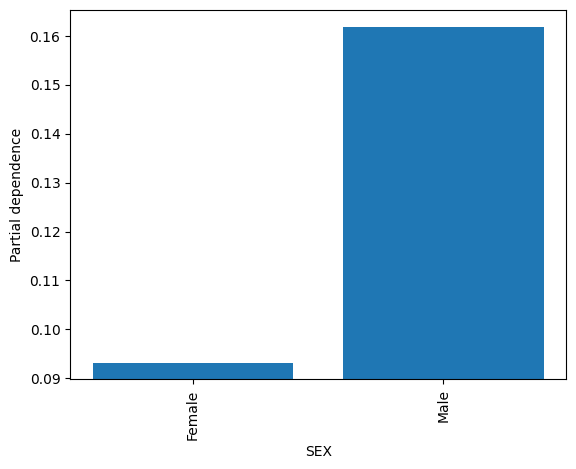

In [ ]:
from sklearn.inspection import PartialDependenceDisplay, partial_dependence

PartialDependenceDisplay.from_estimator(
    rf_oversampled_results.best_estimator_,
    X_test,
    ["SEX"],
    categorical_features=["SEX"],
)

In [ ]:
pdp_weeks_work = partial_dependence(
    rf_oversampled_results.best_estimator_, X_test, features=["WKS_WORK"]
)

pdp_sex = partial_dependence(
    rf_oversampled_results.best_estimator_, X_test, features=["SEX"]
)

pdp_invest = partial_dependence(
    rf_oversampled_results.best_estimator_, X_test, features=["TTL_INVEST_INCOME"]
)

pdp_education = partial_dependence(
    rf_oversampled_results.best_estimator_, X_test, features=["EDUCATION"]
)

pdp_advanced_degree = partial_dependence(
    rf_oversampled_results.best_estimator_, X_test, features=["ADVANCED_DEGREE"]
)

In [ ]:
pdp_advanced_degree

{'grid_values': [array(['0', '1'], dtype=object)],
 'average': array([[0.12043133, 0.24722312]])}

In [ ]:
from typing import TypedDict


class PDPValues(TypedDict):
    grid_values: list[np.ndarray]
    average: np.ndarray


class PlotOptions(TypedDict):
    title: str
    x_axis_label: str
    y_axis_label: str


def plot_feature_pdp(
    pdp_values: PDPValues,
    plot_options: PlotOptions,
    is_categorical: bool = False,
    centered: bool = True,
):
    fig = go.Figure()

    avg_values = deepcopy(pdp_values["average"][0])
    if centered:
        avg_values = avg_values - avg_values.mean()

    match is_categorical:
        case True:
            sorted_indices = np.argsort(avg_values)

            fig.add_trace(
                go.Bar(
                    x=pdp_values["grid_values"][0][sorted_indices],
                    y=avg_values[sorted_indices],
                )
            )
        case False:
            fig.add_trace(
                go.Scatter(
                    x=pdp_values["grid_values"][0],
                    y=avg_values,
                    mode="lines",
                )
            )

    fig.update_layout(
        title=plot_options["title"],
        xaxis_title=plot_options["x_axis_label"],
        yaxis_title=plot_options["y_axis_label"],
        height=800,
        width=1000,
    )
    fig.show()

    return fig

In [ ]:
fig = plot_feature_pdp(
    pdp_weeks_work,
    plot_options={
        "title": "Centered partial dependence: Weeks worked in year on income level",
        "x_axis_label": "Weeks worked in year",
        "y_axis_label": "Centered probability",
    },
)

In [ ]:
fig.update_layout(
    font=dict(size=20),
    plot_bgcolor="rgba(0, 0, 0, 0)",
    paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.write_image("../assets/pdp_weeks_work.png", height=600, width=1200, scale=2)

In [ ]:
fig = plot_feature_pdp(
    pdp_sex,
    plot_options={
        "title": "Partial dependence: Sex on income level",
        "x_axis_label": "Sex",
        "y_axis_label": "Probability",
    },
    is_categorical=True,
)

In [ ]:
fig.update_layout(
    font=dict(size=20),
    plot_bgcolor="rgba(0, 0, 0, 0)",
    paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.write_image("../assets/pdp_sex.png", height=600, width=1200, scale=2)

In [ ]:
fig = plot_feature_pdp(
    pdp_invest,
    plot_options={
        "title": "Centered partial dependence: Total investment income on income level",
        "x_axis_label": "Total investment income",
        "y_axis_label": "Centered probability",
    },
)

In [ ]:
fig.update_layout(
    font=dict(size=20),
    plot_bgcolor="rgba(0, 0, 0, 0)",
    paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.write_image("../assets/pdp_invest.png", height=600, width=1200, scale=2)

In [ ]:
fig = plot_feature_pdp(
    pdp_education,
    plot_options={
        "title": "Centered partial dependence: Education status on income level",
        "x_axis_label": "Education status",
        "y_axis_label": "Centered probability",
    },
    is_categorical=True,
    centered=True,
)

In [ ]:
mapping = {
    "Child or less than high school": "Child or less than high school",
    "High school graduate": "High school graduate",
    "Some college but no degree": "Some college, no degree",
    "Associates degree-occup /vocational": "Associates - occup / vocational",
    "Associates degree-academic program": "Associates - academic",
    "Bachelors degree(BA AB BS)": "Bachelors",
    "Doctorate degree(PhD EdD)": "Doctorate",
    "Masters degree(MA MS MEng MEd MSW MBA)": "Masters",
    "Prof school degree (MD DDS DVM LLB JD)": "Professional school",
}

fig.update_layout(
    font=dict(size=16),
    plot_bgcolor="rgba(0, 0, 0, 0)",
    paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.update_xaxes(tickvals=list(mapping.keys()), ticktext=list(mapping.values()))
fig.write_image("../assets/pdp_education.png", height=600, width=600, scale=2)

In [ ]:
fig = plot_feature_pdp(
    pdp_advanced_degree,
    plot_options={
        "title": "Centered partial dependence: Having advanced degree on income level",
        "x_axis_label": "Advanced degree",
        "y_axis_label": "Centered probability",
    },
    is_categorical=True,
)

In [ ]:
fig.update_layout(
    font=dict(size=16),
    plot_bgcolor="rgba(0, 0, 0, 0)",
    paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.write_image("../assets/pdp_advanced_degree.png", height=600, width=600, scale=2)

# Future work

## Data

- Determine precise missing value pattern for migration variables as they might provide good predictive power for income level
    - Using Wasserstein distance or population stability index for more rigorous distribution comparisons
- Create more education-employment or age-employment interactions

## Technical

- One hot encoding does not always produce the best outcomes in RF model due to the number of new independent features the encoding creates
- Engineer additional features that have strong associations with income level